In [56]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [57]:
train = pd.read_csv('train.csv', index_col=False)
print(train.head())
test = pd.read_csv('test.csv')
print(test.head())
print('train.shape : ', train.shape)
print('test.shape : ', test.shape)
print('train.columns : ', train.columns)
#loc index
alldata = pd.concat((train.loc[:,'MSSubClass':'SaleCondition'],
                     test.loc[:,'MSSubClass':'SaleCondition']))
alldata = alldata.reset_index(drop=True)

   Id  MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0   1          60       RL         65.0     8450   Pave   NaN      Reg   
1   2          20       RL         80.0     9600   Pave   NaN      Reg   
2   3          60       RL         68.0    11250   Pave   NaN      IR1   
3   4          70       RL         60.0     9550   Pave   NaN      IR1   
4   5          60       RL         84.0    14260   Pave   NaN      IR1   

  LandContour Utilities  ... PoolArea PoolQC Fence MiscFeature MiscVal MoSold  \
0         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      2   
1         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      5   
2         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      9   
3         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      2   
4         Lvl    AllPub  ...        0    NaN   NaN         NaN       0     12   

  YrSold  SaleType  SaleCondition  SalePrice  
0   2008        WD   

In [58]:
misscol = []
for col in alldata.columns:
    if alldata[col].isnull().sum()>0:
        misscol.append(col)
        print(col,":",alldata[col].isnull().sum())

MSZoning : 4
LotFrontage : 486
Alley : 2721
Utilities : 2
Exterior1st : 1
Exterior2nd : 1
MasVnrType : 24
MasVnrArea : 23
BsmtQual : 81
BsmtCond : 82
BsmtExposure : 82
BsmtFinType1 : 79
BsmtFinSF1 : 1
BsmtFinType2 : 80
BsmtFinSF2 : 1
BsmtUnfSF : 1
TotalBsmtSF : 1
Electrical : 1
BsmtFullBath : 2
BsmtHalfBath : 2
KitchenQual : 1
Functional : 2
FireplaceQu : 1420
GarageType : 157
GarageYrBlt : 159
GarageFinish : 159
GarageCars : 1
GarageArea : 1
GarageQual : 159
GarageCond : 159
PoolQC : 2909
Fence : 2348
MiscFeature : 2814
SaleType : 1


In [59]:
alldata['Exterior1st'].value_counts(dropna=False)

VinylSd    1025
MetalSd     450
HdBoard     442
Wd Sdng     411
Plywood     221
CemntBd     126
BrkFace      87
WdShing      56
AsbShng      44
Stucco       43
BrkComm       6
Stone         2
CBlock        2
AsphShn       2
ImStucc       1
NaN           1
Name: Exterior1st, dtype: int64

In [60]:
alldata[alldata.GarageType.isnull()].loc[:,['GarageType','GarageYrBlt','GarageFinish','GarageQual']]

,GarageType,GarageYrBlt,GarageFinish,GarageQual
39,NaN,NaN,NaN,NaN
48,NaN,NaN,NaN,NaN
78,NaN,NaN,NaN,NaN
88,NaN,NaN,NaN,NaN
89,NaN,NaN,NaN,NaN
...,...,...,...,...
2893,NaN,NaN,NaN,NaN
2909,NaN,NaN,NaN,NaN
2913,NaN,NaN,NaN,NaN
2914,NaN,NaN,NaN,NaN


In [61]:
def fill_nan(data):
    data['LotFrontage'] = data['LotFrontage'].fillna(0)
    data['Alley'] = data['Alley'].fillna('missing')
    data['MasVnrType'] = data['MasVnrType'].fillna('None')
    data['MasVnrArea'] = data['MasVnrArea'].fillna(0)
    data['BsmtQual'] = data['BsmtQual'].fillna('TA')
    data['BsmtCond'] = data['BsmtCond'].fillna('TA')
    data['BsmtExposure'] = data['BsmtExposure'].fillna('No')
    data['BsmtFinType1'] = data['BsmtFinType1'].fillna('Unf')
    data['BsmtFinType2'] = data['BsmtFinType2'].fillna('Unf')
    data['Electrical'] = data['Electrical'].fillna('SBrkr')
    data['FireplaceQu'] = data['FireplaceQu'].fillna('missing')
    data['GarageType'] = data['GarageType'].fillna('Attchd')
    data = data.drop('GarageYrBlt', axis=1)
    data['GarageFinish'] = data['GarageFinish'].fillna('Unf')
    data['GarageQual'] = data['GarageQual'].fillna('TA')
    data['GarageCond'] = data['GarageCond'].fillna('TA')
    data['PoolQC'] = data['PoolQC'].fillna('missing')
    data['Fence'] = data['Fence'].fillna('missing')
    data['MiscFeature'] = data['MiscFeature'].fillna('missing')
    data['MSZoning'] = data['MSZoning'].fillna(data['MSZoning'].mode()[0]) # 針對數量極少的NaN，直接使用眾數來代替
    data['Utilities'] = data['Utilities'].fillna(data['Utilities'].mode()[0])
    data['Exterior1st'] = data['Exterior1st'].fillna(data['Exterior1st'].mode()[0])
    data['Exterior2nd'] = data['Exterior2nd'].fillna(data['Exterior2nd'].mode()[0])
    data['BsmtFinSF1'] = data['BsmtFinSF1'].fillna(data['BsmtFinSF1'].mode()[0])
    data['BsmtFinSF2'] = data['BsmtFinSF2'].fillna(data['BsmtFinSF2'].mode()[0])
    data['BsmtUnfSF'] = data['BsmtUnfSF'].fillna(data['BsmtUnfSF'].mode()[0])
    data['TotalBsmtSF'] = data['TotalBsmtSF'].fillna(data['TotalBsmtSF'].mode()[0])
    data['BsmtFullBath'] = data['BsmtFullBath'].fillna(data['BsmtFullBath'].mode()[0])
    data['BsmtHalfBath'] = data['BsmtHalfBath'].fillna(data['BsmtHalfBath'].mode()[0])
    data['KitchenQual'] = data['KitchenQual'].fillna(data['KitchenQual'].mode()[0])
    data['Functional'] = data['Functional'].fillna(data['Functional'].mode()[0])
    data['GarageCars'] = data['GarageCars'].fillna(data['GarageCars'].mode()[0])
    data['GarageArea'] = data['GarageArea'].fillna(data['GarageArea'].mode()[0])
    data['SaleType'] = data['SaleType'].fillna(data['SaleType'].mode()[0])

    return data

In [62]:
alldata = fill_nan(alldata)
print('處理完後NaN數量:',alldata.isnull().any().sum())

處理完後NaN數量: 0


In [63]:
print(alldata.columns)

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageFinish',
       'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive',
       'WoodDeckSF', 'Ope

In [64]:
categorical = [col for col in alldata.columns if alldata[col].dtype == 'O']
for i in categorical:
    print(i,':',alldata[i].unique())

MSZoning : ['RL' 'RM' 'C (all)' 'FV' 'RH']
Street : ['Pave' 'Grvl']
Alley : ['missing' 'Grvl' 'Pave']
LotShape : ['Reg' 'IR1' 'IR2' 'IR3']
LandContour : ['Lvl' 'Bnk' 'Low' 'HLS']
Utilities : ['AllPub' 'NoSeWa']
LotConfig : ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
LandSlope : ['Gtl' 'Mod' 'Sev']
Neighborhood : ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']
Condition1 : ['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe']
Condition2 : ['Norm' 'Artery' 'RRNn' 'Feedr' 'PosN' 'PosA' 'RRAn' 'RRAe']
BldgType : ['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 'Twnhs']
HouseStyle : ['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']
RoofStyle : ['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Shed']
RoofMatl : ['CompShg' 'WdShngl' 'Metal' 'WdShake' 'Membran' 'Tar&Grv' 'Roll'
 'ClyTil

In [65]:
from sklearn.preprocessing import LabelEncoder
# 這裏有些使用map有些使用labelencoder的原因是因為將數值轉換為str後，順序會亂掉導致labelencoder轉換不正確
# 順序不正確的需要額外挑出來重新排序
alldata['MSSubClass'] = alldata['MSSubClass'].astype(str).map({'20':0,'30':1,'40':2,'45':3,'50':4,'60':5,'70':6,'75':7,'80':8,'85':9,'90':10,'120':11,'150':12,'160':13,'180':14,'190':15})
alldata['OverallQual'] = alldata['OverallQual'].astype(str).map({'1':0,'2':1,'3':2,'4':3,'5':4,'6':5,'7':6,'8':7,'9':8,'10':9})
alldata['MoSold'] = alldata['MoSold'].astype(str).map({'1':0,'2':1,'3':2,'4':3,'5':4,'6':5,'7':6,'8':7,'9':8,'10':9,'11':10,'12':11})
alldata['HouseStyle'] = alldata['HouseStyle'].map({'1Story':0,'1.5Unf':1,'1.5Fin':2,'2Story':3,'2.5Unf':4,'2.5Fin':5,'SFoyer':6,'SLvl':7})

qual_dict = {'missing':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5}
alldata['ExterQual'] = alldata['ExterQual'].map(qual_dict)
alldata['ExterCond'] = alldata['ExterCond'].map(qual_dict)
alldata['BsmtQual'] = alldata['BsmtQual'].map(qual_dict)
alldata['BsmtCond'] = alldata['BsmtCond'].map(qual_dict)
alldata['HeatingQC'] = alldata['HeatingQC'].map(qual_dict)
alldata['KitchenQual'] = alldata['KitchenQual'].map(qual_dict)
alldata['FireplaceQu'] = alldata['FireplaceQu'].map(qual_dict)
alldata['GarageQual'] = alldata['GarageQual'].map(qual_dict)
alldata['GarageCond'] = alldata['GarageCond'].map(qual_dict)
alldata['PoolQC'] = alldata['PoolQC'].map(qual_dict)

alldata['BsmtExposure'] = alldata['BsmtExposure'].map({'No':0,'Mn':1,'Av':2,'Gd':3})
alldata['BsmtFinType1'] = alldata['BsmtFinType1'].map({'Unf':0,'LwQ':1,'Rec':2,'BLQ':3,'ALQ':4,'GLQ':5})
alldata['BsmtFinType2'] = alldata['BsmtFinType2'].map({'Unf':0,'LwQ':1,'Rec':2,'BLQ':3,'ALQ':4,'GLQ':5})
alldata['Functional'] = alldata['Functional'].map({'Sal':0,'Sev':1,'Maj2':2,'Maj1':3,'Mod':4,'Min2':5,'Min1':6,'Typ':7})
alldata['GarageFinish'] = alldata['GarageFinish'].map({'Unf':0,'RFn':1,'Fin':2})
alldata['Fence'] = alldata['Fence'].map({'missing':0,'MnWw':1,'GdWo':2,'MnPrv':3,'GdPrv':4})


alldata['OverallCond'] = alldata['OverallCond'].astype(str)
alldata['YearRemodAdd'] = alldata['YearRemodAdd'].astype(str)
cols = ['Street','Alley','LandSlope','Foundation','CentralAir','PavedDrive','OverallCond','YearRemodAdd']

for col in cols:
    lbender = LabelEncoder() 
    lbender.fit(list(alldata[col].values)) 
    alldata[col] = lbender.transform(list(alldata[col].values))

In [66]:
def numerical_proc(data):
    data['BsmtFinType'] = data['BsmtFinType1'] + data['BsmtFinType2']
    data['BsmtFinSF'] = data['BsmtFinSF1'] + data['BsmtFinSF2']
    data['TotalSF'] = data['TotalBsmtSF'] + data['1stFlrSF'] + data['2ndFlrSF']
    data['Bath'] = data['BsmtFullBath'] + data['BsmtHalfBath'] + data['FullBath'] + data['HalfBath']
    data['Porch'] = data['OpenPorchSF'] + data['EnclosedPorch'] + data['3SsnPorch'] + data['ScreenPorch']
    data['BuildingAge'] = data['YrSold'] - data['YearBuilt']
    return data

alldata = numerical_proc(alldata)

In [67]:
alldata['YrSold'] = alldata['YrSold'].astype(str)
alldata['YearBuilt'] = alldata['YearBuilt'].astype(str)
cols = ['YrSold','YearBuilt']
for col in cols:
    lbender = LabelEncoder() 
    lbender.fit(list(alldata[col].values)) 
    alldata[col] = lbender.transform(list(alldata[col].values))

In [68]:
continuous = ['LotFrontage','LotArea','MasVnrArea','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','BsmtFinSF1','ScreenPorch','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','BsmtFinSF','2ndFlrSF','TotalSF','LowQualFinSF','GrLivArea','Porch','BuildingAge']

In [69]:
plotdd = alldata[:train.shape[0]]
plotdd['SalePrice'] = train.SalePrice

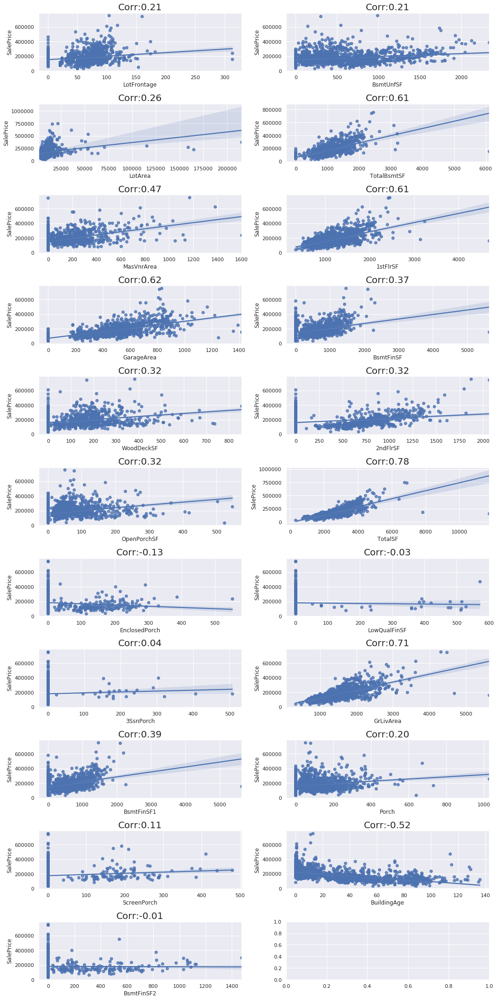

In [70]:
rcParams['figure.figsize'] = (15,30)
fig, axes = plt.subplots(11,2)
sns.set()
for i in range(len(continuous)):
    if i < 11:
        pp = sns.regplot(data=plotdd, x=continuous[i], y='SalePrice', ax=axes[i,0])
        pp.set_title('Corr:%.2f' % np.corrcoef(plotdd['SalePrice'],plotdd[continuous[i]])[0,1],size=20)
    else:
        pp2 = sns.regplot(data=plotdd, x=continuous[i], y='SalePrice', ax=axes[i-11,1])
        pp2.set_title('Corr:%.2f' % np.corrcoef(plotdd['SalePrice'],plotdd[continuous[i]])[0,1],size=20)
    plt.tight_layout()

In [71]:
y = train['SalePrice']

#alldata = alldata.drop(plotdd[(plotdd['TotalBsmtSF']>5000) & (plotdd['SalePrice']<300000)].index)
#alldata = alldata.drop(plotdd[(plotdd['1stFlrSF']>4000) & (plotdd['SalePrice']<300000)].index)
#alldata = alldata.drop(plotdd[(plotdd['BsmtFinSF']>5000) & (plotdd['SalePrice']<300000)].index)
#alldata = alldata.drop(plotdd[(plotdd['TotalSF']>10000) & (plotdd['SalePrice']<300000)].index)

# 這裏發現離群值其實都是同一筆，而GrLivArea的離群值多一筆
#alldata = alldata.drop(plotdd[(plotdd['GrLivArea']>4000) & (plotdd['SalePrice']<300000)].index)
#y = train['SalePrice'].drop(plotdd[(plotdd['GrLivArea']>4000) & (plotdd['SalePrice']<300000)].index)

#plotdd = plotdd.drop(plotdd[(plotdd['GrLivArea']>4000) & (plotdd['SalePrice']<300000)].index)

#alldata = alldata.drop(plotdd[(plotdd['BsmtFinSF1']>5000) & (plotdd['SalePrice']<300000)].index)

In [72]:
discrete1 = ['LandSlope','YearBuilt','PavedDrive','Functional','CentralAir','BsmtExposure','Alley','GarageFinish','BsmtFinType2','FullBath','OverallCond','BsmtCond','BsmtFinType','Fireplaces']

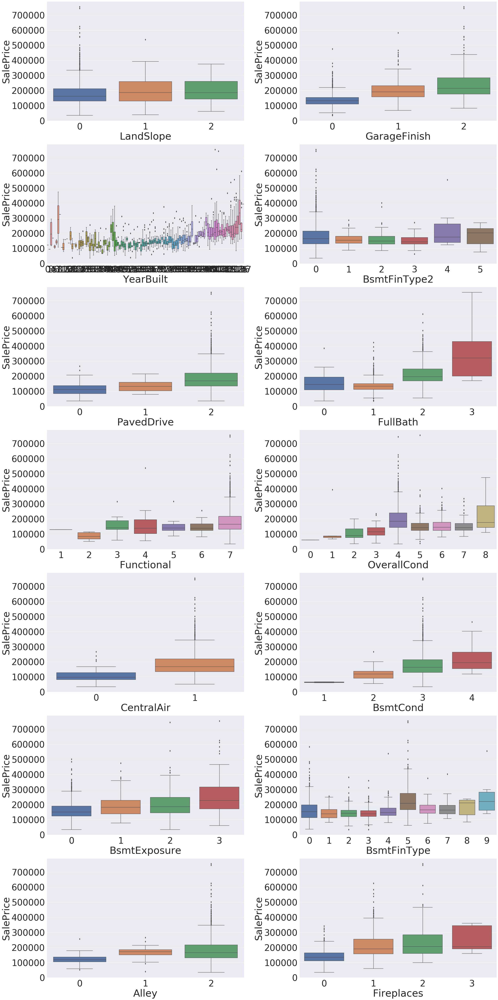

In [73]:
sns.set(font_scale=4)
rcParams['figure.figsize'] = (35,70)
fig, axes = plt.subplots(7,2)
sns.set(color_codes=True)
for i in range(len(discrete1)):
    if i < 7:
        pp = sns.boxplot(data=plotdd, x=discrete1[i], y='SalePrice', ax=axes[i,0])
        pp.set_xlabel(discrete1[i],fontsize=50)
    else:
        pp2 = sns.boxplot(data=plotdd, x=discrete1[i], y='SalePrice', ax=axes[i-7,1])
        pp2.set_xlabel(discrete1[i],fontsize=50)
    plt.tight_layout()

In [74]:
discrete2 = ['Street','GarageCond','BsmtFinType1','GarageCars','ExterQual','TotRmsAbvGrd','OverallQual','BsmtQual','KitchenQual','Bath','FireplaceQu','GarageQual','BsmtFullBath','HeatingQC']

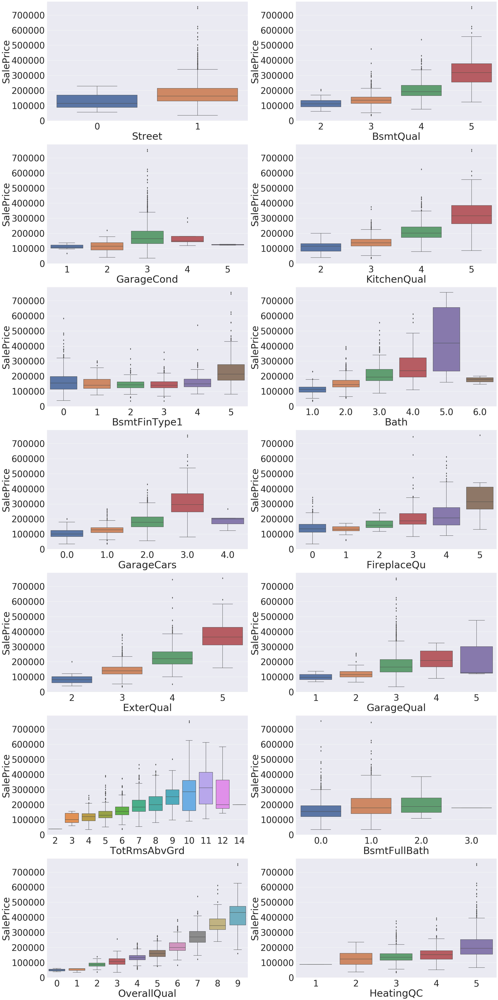

In [75]:
sns.set(font_scale=4)
rcParams['figure.figsize'] = (35,70)
fig, axes = plt.subplots(7,2)
sns.set(color_codes=True)
for i in range(len(discrete2)):
    if i < 7:
        pp = sns.boxplot(data=plotdd, x=discrete2[i], y='SalePrice', ax=axes[i,0])
        pp.set_xlabel(discrete2[i],fontsize=50)
    else:
        pp2 = sns.boxplot(data=plotdd, x=discrete2[i], y='SalePrice', ax=axes[i-7,1])
        pp2.set_xlabel(discrete2[i],fontsize=50)
    plt.tight_layout()

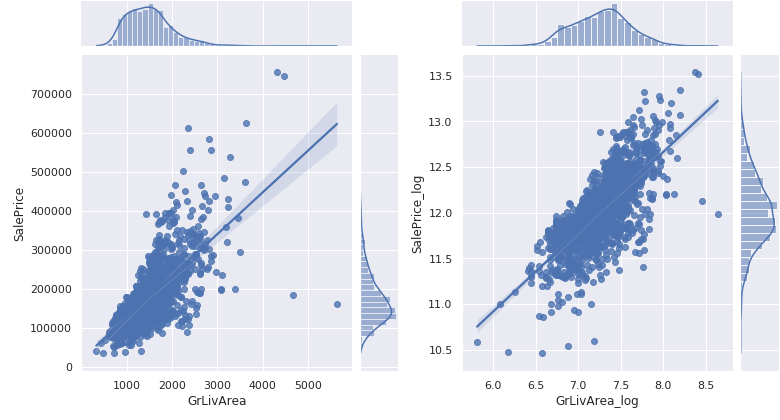

In [76]:
from scipy.stats import zscore
example = plotdd.copy()
example['SalePrice_log'] = np.log1p(example['SalePrice'])
example['GrLivArea_log'] = np.log1p(example['GrLivArea'])

sns.set()
import matplotlib.gridspec as gridspec
import SeabornFig2Grid as sfg
pp = sns.jointplot(x='GrLivArea',y='SalePrice',data=example,kind='reg')
pp2 = sns.jointplot(x='GrLivArea_log',y='SalePrice_log',data=example,kind='reg')

fig = plt.figure(figsize=(11,6))
gs = gridspec.GridSpec(1,2)

sfg.SeabornFig2Grid(pp, fig, gs[0])
sfg.SeabornFig2Grid(pp2, fig, gs[1])
plt.tight_layout()
plt.show()

In [77]:
numerical_alldata = [col for col in alldata.columns if alldata[col].dtype != 'O']

In [78]:
from scipy.stats import skew
skew_indx = alldata.skew(axis=0).sort_values(ascending=False)
print(skew_indx.head(10))

MiscVal          21.958480
PoolQC           18.418603
PoolArea         16.907017
LotArea          12.829025
LowQualFinSF     12.094977
3SsnPorch        11.381914
LandSlope         4.977715
KitchenAbvGr      4.304467
BsmtFinSF2        4.148275
EnclosedPorch     4.005950
dtype: float64


In [79]:
skew_indx = skew_indx[abs(skew_indx) > 0.75]
skew_indx = skew_indx.index
alldata[skew_indx] = np.log1p(alldata[skew_indx])  #還原: alldata[skew_indx].apply(np.expm1)

In [80]:
alldata = pd.get_dummies(alldata)

In [81]:
preproced_record_number = 1460
X_train = alldata[:preproced_record_number]
X_test = alldata[preproced_record_number:]
y_train = y
y_train = np.log1p(y_train) # 將預測值SalePrice取對數，讓特徵與預測值相關性提高

In [82]:
print('X_train.shape: ',X_train.shape)
print('X_test.shape: ',X_test.shape)
print('y_train.shape: ',y_train.shape)

X_train.shape:  (1460, 217)
X_test.shape:  (1459, 217)
y_train.shape:  (1460,)


In [83]:
import pandas_profiling

In [84]:
# profiling report
# pandas_profiling.ProfileReport(X_train)

In [85]:
highly_correlated_columns = [
'BsmtFinSF2', 'PoolQC', 'BsmtFinType', 'BsmtFinSF', 'Exterior2nd_CBlock',
'Exterior2nd_CmentBd', 'Exterior2nd_MetalSd', 'Exterior2nd_VinylSd', 'MiscFeature_Shed', 'SaleCondition_Partial'
]

In [86]:
#移除高相關的欄位
X_train.drop(highly_correlated_columns, axis=1, inplace=True)
X_test.drop(highly_correlated_columns, axis=1, inplace=True)

In [87]:
X_train.shape, X_test.shape

((1460, 207), (1459, 207))

In [88]:
#XGBoost
import xgboost as xgb

dtrain = xgb.DMatrix(X_train, label = y_train)
dtest = xgb.DMatrix(X_test)

params = {"colsample_bytree":0.4603, "gamma":0.0468, 
          "learning_rate":0.05, "max_depth":3, 
          "min_child_weight":1.7817, "n_estimators":2200,
          "reg_alpha":0.4640, "reg_lambda":0.8571,
          "subsample":0.5213, "silent":1,
          "nthread":-1}

model = xgb.cv(params, dtrain, num_boost_round=500, early_stopping_rounds=100)

In [89]:
#XGBoost
import xgboost as xgb

dtrain = xgb.DMatrix(X_train, label = y_train)
dtest = xgb.DMatrix(X_test)

params = {"colsample_bytree":0.4603, "gamma":0.0468, 
          "learning_rate":0.05, "max_depth":3, 
          "min_child_weight":1.7817, "n_estimators":2200,
          "reg_alpha":0.4640, "reg_lambda":0.8571,
          "subsample":0.5213, "silent":1,
          "nthread":-1}

model = xgb.cv(params, dtrain, num_boost_round=500, early_stopping_rounds=100)

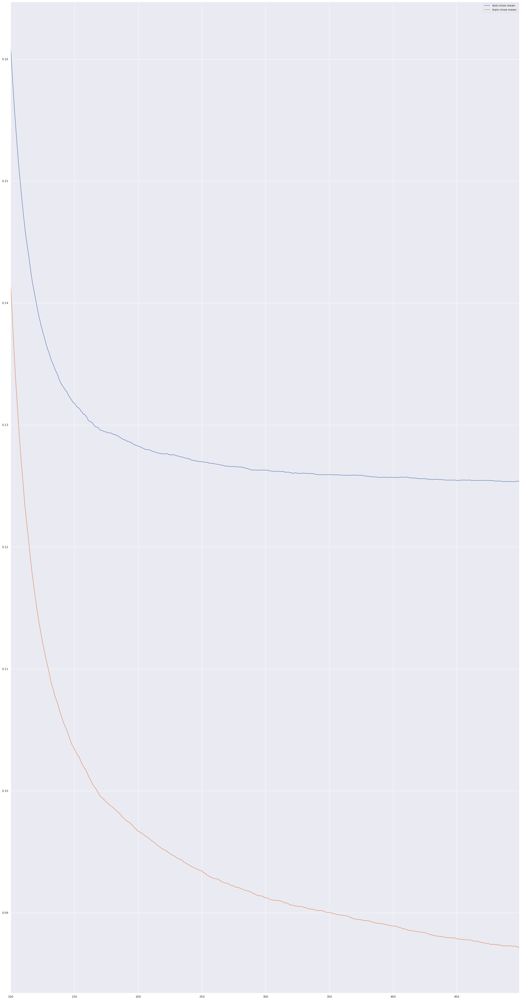

In [90]:
#plt.figure(figsize=(8, 4))
plt.rcParams['axes.unicode_minus']=False #正常顯示負號
plt.rcParams['font.size']=12

model.loc[100:,["test-rmse-mean", "train-rmse-mean"]].plot()

In [91]:
from sklearn.model_selection import train_test_split
_X_train, _X_test, _y_train, _y_test = train_test_split(X_train, y_train, test_size = 0.2)
X_train.head(2)

,MSSubClass,LotFrontage,LotArea,Street,Alley,LandSlope,HouseStyle,OverallQual,OverallCond,YearBuilt,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal
0,5,65.0,9.042040,0.693147,1.098612,0.0,1.386294,6,4,110,...,0,0,0,0,1,0,0,0,0,1
1,0,80.0,9.169623,0.693147,1.098612,0.0,0.000000,5,7,83,...,0,0,0,0,1,0,0,0,0,1


In [92]:
from sklearn import metrics

xgb_f = xgb.XGBRegressor(**params) #the params were tuned using xgb.cv

xgb_f.fit(_X_train, _y_train)

print("MSE: %.2f" % np.mean((xgb_f.predict(_X_test) - _y_test.values.ravel()) ** 2))
print("R Square:", xgb_f.score(_X_test, _y_test))

MSE: 0.02
R Square: 0.9100071527682404


In [93]:
import shap
# load JS visualization code to notebook
shap.initjs()

In [94]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn and spark models)
explainer = shap.TreeExplainer(xgb_f)
shap_values = explainer.shap_values(_X_train)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[99,:], _X_train.iloc[99,:])

In [95]:
df_shap_values = pd.DataFrame(shap_values, columns=_X_train.columns)
df_shap_values.head(3)

,MSSubClass,LotFrontage,LotArea,Street,Alley,LandSlope,HouseStyle,OverallQual,OverallCond,YearBuilt,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal
0,0.000207,-0.001280,-0.019392,0.0,0.000301,-0.000072,0.002948,-0.136711,0.040455,-0.006474,...,0.0,0.0,-0.000505,0.0,-0.000168,0.001615,0.0,-0.000006,0.000182,0.001380
1,-0.002688,-0.001660,-0.007665,0.0,0.000291,-0.000087,-0.001983,0.052356,-0.006782,0.010963,...,0.0,0.0,-0.000684,0.0,-0.000269,0.001419,0.0,-0.000006,0.000161,0.000654
2,0.000012,-0.001878,0.006707,0.0,0.000291,-0.000219,0.003091,-0.017237,-0.006741,0.010677,...,0.0,0.0,-0.000684,0.0,-0.000196,0.001545,0.0,-0.000006,0.000347,0.000926


In [96]:
y_base = explainer.expected_value
print(y_base)

12.019431


In [97]:
#驗證一下預測值的shap value組成
shap_values[99,:].sum(), y_base, y_base + shap_values[99,:].sum()

(0.223522, 12.019431, 12.242953)

In [98]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, _X_train)

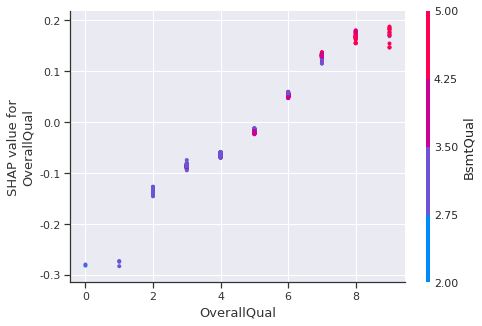

In [99]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("OverallQual", shap_values, _X_train)

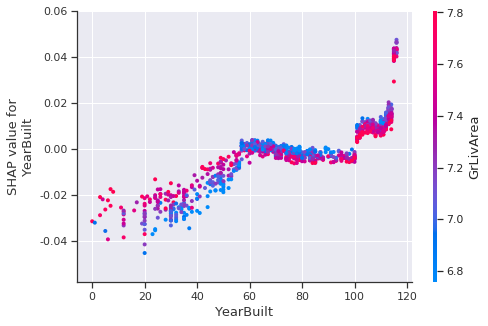

In [100]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("YearBuilt", shap_values, _X_train)

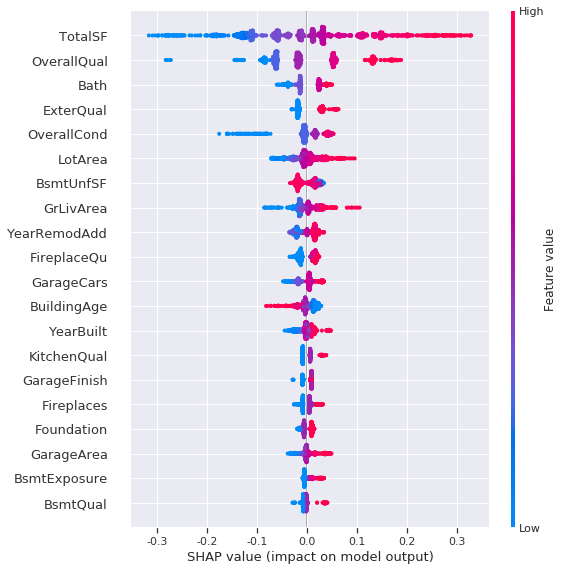

In [101]:
# summarize the effects of all the features
shap.summary_plot(shap_values, _X_train)

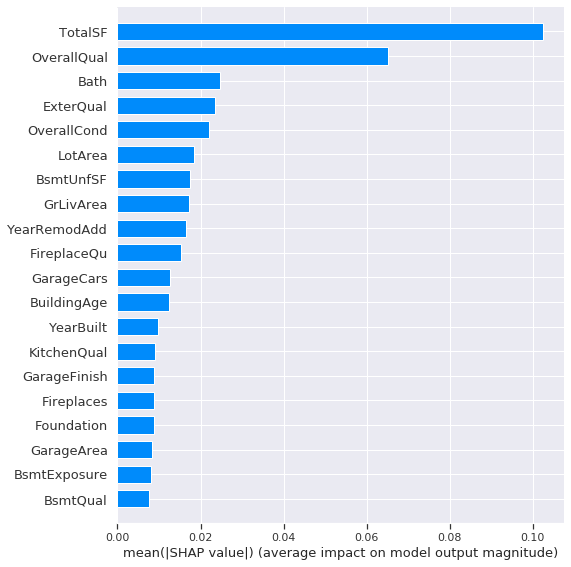

In [102]:
shap.summary_plot(shap_values, X_train, plot_type="bar")

In [172]:
train_rmse=[]
vaildate_rmse=[]
alg_list=['linear regression', 'knn', 'decision tree', 'SVR', 'random forest']

# Linear Regression
from sklearn.model_selection import train_test_split
_X_train, _X_test, _y_train, _y_test = train_test_split(X_train, y_train, random_state = 92003, test_size = 0.2)

from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(_X_train, _y_train)
y_pred = model.predict(_X_test)
validate = np.sqrt(np.mean((y_pred - _y_test)**2))


        Id      SalePrice
0     1461  116922.705480
1     1462  120114.293091
2     1463  120956.218011
3     1464  121697.547562
4     1465  122605.210971
...    ...            ...
1454  2915  113674.294187
1455  2916  112763.914923
1456  2917  119883.883924
1457  2918  117264.216246
1458  2919  123095.605977

[1459 rows x 2 columns]


In [162]:
# plt.scatter(_y_test, y_pred)
# plt.plot([0, 50], [0, 50], '--k')
# plt.axis('tight')
# plt.xlabel('True price ($1000s)')
# plt.ylabel('Predicted price ($1000s)')
print("RMS:", np.sqrt(np.mean((y_pred - _y_test)**2)))
print('R2:%.2f' % metrics.r2_score(y_pred, _y_test))
# print(X_train, y_train)

y_pred = model.predict(_X_train)
print("RMS:", np.sqrt(np.mean((y_pred - _y_train)**2)))
print('R2:%.2f' % metrics.r2_score(y_pred, _y_train))

trainging = np.sqrt(np.mean((y_pred - _y_train)**2))

vaildate_rmse.append(validate)
train_rmse.append(trainging)

RMS: 0.1427644267572864
R2:0.87
RMS: 0.09229117742241216
R2:0.94


In [163]:
# KNN regression
from sklearn.neighbors import KNeighborsRegressor

knn_model = KNeighborsRegressor(n_neighbors=10)
knn_model.fit(_X_train, _y_train)
knn_y_pred = knn_model.predict(_X_test)
validate = np.sqrt(np.mean((knn_y_pred - _y_test)**2))

print("RMS:", np.sqrt(np.mean((knn_y_pred - _y_test)**2)))
print('R2:%.2f' % metrics.r2_score(knn_y_pred, _y_test))

knn_y_pred = knn_model.predict(_X_train)
print("RMS:", np.sqrt(np.mean((knn_y_pred - _y_train)**2)))
print('R2:%.2f' % metrics.r2_score(knn_y_pred, _y_train))
trainging = np.sqrt(np.mean((knn_y_pred - _y_train)**2))

vaildate_rmse.append(validate)
train_rmse.append(trainging)

RMS: 0.2576082120243077
R2:0.35
RMS: 0.2217974696083368
R2:0.50


In [164]:
#decision tree
from sklearn import tree
tree = tree.DecisionTreeRegressor()
tree.fit(_X_train, _y_train)
dt_ypredict = tree.predict(_X_test)
validate = np.sqrt(np.mean((dt_ypredict - _y_test)**2))

print("RMS:", np.sqrt(np.mean((dt_ypredict - _y_test)**2)))
print('R2:%.2f' % metrics.r2_score(dt_ypredict, _y_test))

dt_ypredict = tree.predict(_X_train)
print("RMS:", np.sqrt(np.mean((dt_ypredict - _y_train)**2)))
print('R2:%.2f' % metrics.r2_score(dt_ypredict, _y_train))
trainging = np.sqrt(np.mean((dt_ypredict - _y_train)**2))

vaildate_rmse.append(validate)
train_rmse.append(trainging)

RMS: 0.22476131283949818
R2:0.71
RMS: 3.130873578813246e-05
R2:1.00


In [165]:
# SVR
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

clf = SVR(kernel='rbf', C=1e3, gamma=0.001)
clf.fit(_X_train, _y_train)

svr_y_pred = clf.predict(_X_test)
validate = np.sqrt(np.mean((svr_y_pred - _y_test)**2))

print("RMS:", np.sqrt(np.mean((svr_y_pred - _y_test)**2)))
print('R2:%.2f' % metrics.r2_score(svr_y_pred, _y_test))

svr_y_pred = clf.predict(_X_train)

print("RMS:", np.sqrt(np.mean((svr_y_pred - _y_train)**2)))
print('R2:%.2f' % metrics.r2_score(svr_y_pred, _y_train))

trainging = np.sqrt(np.mean((svr_y_pred - _y_train)**2))
vaildate_rmse.append(validate)
train_rmse.append(trainging)

RMS: 0.25713520521152916
R2:0.36
RMS: 0.08439178340180252
R2:0.95


In [166]:
# random forest
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor()
rfr.fit(_X_train, _y_train)
rfr_y_pred = rfr.predict(_X_test)
validate = np.sqrt(np.mean((rfr_y_pred - _y_test)**2))

print("RMS:", np.sqrt(np.mean((rfr_y_pred - _y_test)**2)), validate)
print('R2:%.2f' % metrics.r2_score(rfr_y_pred, _y_test))

rfr_y_pred = rfr.predict(_X_train)
print('R2:%.2f' % metrics.r2_score(rfr_y_pred, _y_train))
trainging = np.sqrt(np.mean((rfr_y_pred - _y_train)**2))
print("RMS:", np.sqrt(np.mean((rfr_y_pred - _y_train)**2)), trainging)

vaildate_rmse.append(validate)
train_rmse.append(trainging)

RMS: 0.14814725192994566 0.14814725192994566
R2:0.85
R2:0.97
RMS: 0.06469243097988026 0.06469243097988026


In [168]:
alg_vs = pd.DataFrame({'Alg':alg_list, 'Train RMSE':train_rmse, 'Validate RMSE':vaildate_rmse})
print(alg_vs)
alg_vs.to_csv("output.csv",index=False)

                 Alg  Train RMSE  Validate RMSE
0  linear regression    0.092291       0.142764
1                knn    0.221797       0.257608
2      decision tree    0.000031       0.224761
3                SVR    0.084392       0.257135
4      random forest    0.064692       0.148147


In [177]:
y_pred = model.predict(X_test)
test.to_csv('linear_regression.csv', index=False)
result=pd.DataFrame({'Id':test.Id, 'SalePrice':y_pred*10000})
print(result)
result.to_csv("linear_regression.csv",index=False)

        Id      SalePrice
0     1461  116922.705480
1     1462  120114.293091
2     1463  120956.218011
3     1464  121697.547562
4     1465  122605.210971
...    ...            ...
1454  2915  113674.294187
1455  2916  112763.914923
1456  2917  119883.883924
1457  2918  117264.216246
1458  2919  123095.605977

[1459 rows x 2 columns]
